In [266]:
import h5py
import glob
import os
import numpy as np
import pandas as pd
import scipy as sp
import seaborn as sns
import cooler
from itertools import cycle, islice

import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.colors import LogNorm
from matplotlib import cm as cm
import cooltools.lib.plotting

from scipy import ndimage as nd
from scipy.stats import pearsonr
from scipy.signal import find_peaks
from sklearn.decomposition import PCA
from statsmodels.sandbox.stats.multicomp import multipletests as FDR
from concurrent.futures import ProcessPoolExecutor, as_completed

In [267]:
def compbulk(Qall, chrom_sizes, binall, cpg): 
    Call = []
    pcall = []
    modelall = []
    for k,chrom in enumerate(chrom_sizes.index[:]):
        Q = Qall[k].copy()

        print(f"start distance normalization for chrom {chrom}...")
        decay = np.array([np.mean(np.diag(Q, i)) for i in range(Q.shape[0])])
        E = np.zeros(Q.shape)
        row, col = np.diag_indices(E.shape[0])
        E[row, col] = 1
        for i in range(1, E.shape[0]):
            E[row[:-i], col[i:]] = (Q[row[:-i], col[i:]] + 1e-5) / (decay[i] + 1e-5)
        E = E + E.T
        C = np.corrcoef(np.log2(E + 0.001))
        Call.append(C)
        binfilter = binall[k]
        
        print("start PCA...")
        pca = PCA(n_components=2)
        pc = pca.fit_transform(C)
        cpgtmp = cpg.loc[cpg['chrom']==chrom, 'cpg_ratio'].values[binfilter]
        r = []
        for i in range(2):
            labels, groups = pd.qcut(pc[:,i], 50, labels=False, retbins=True)
            sad = np.array([[E[np.ix_(labels==i, labels==j)].sum() for i in range(50)] for j in range(50)])
            count = np.array([[(labels==i).sum()*(labels==j).sum() for i in range(50)] for j in range(50)])
            sad = sad / count
            r.append((sad[:10, :10].sum() + sad[-10:, -10:].sum()) / (sad[:10, -10:].sum() + sad[-10:, :10].sum()))

        if r[0]>r[1]:
            i = 0
        else:
            i = 1
        if pearsonr(cpgtmp, pc[:,i])[0]>0:
            pc = pc[:,i]
            modelall.append(pca.components_[i])
        else:
            pc = -pc[:,i]
            modelall.append(-pca.components_[i])
        pcall.append(pc)
    return Call, pcall, modelall

In [268]:
def compsaddle(cool): 
    sad = np.zeros((50, 50))
    count = np.zeros((50, 50))
    comptmp = []
    for k,chrom in enumerate(chrom_sizes.index[:]):
        Q = cool.matrix(balance=False, sparse=True).fetch(chrom).toarray()
        Q = Q - np.diag(np.diag(Q))
        pc = np.zeros(Q.shape[0])
        binfilter = binall[k]
        Q = Q[binfilter][:, binfilter]
        decay = np.array([np.mean(np.diag(Q, i)) for i in range(Q.shape[0])])
        E = np.zeros(Q.shape)
        row, col = np.diag_indices(E.shape[0])
        E[row, col] = 1
        for i in range(1, E.shape[0]):
            E[row[:-i], col[i:]] = (Q[row[:-i], col[i:]] + 1e-5) / (decay[i] + 1e-5)
        E = E + E.T
        C = np.corrcoef(np.log2(E + 0.001))
        pc = (C-np.mean(C, axis=0)).dot(modelall[k])
        comptmp.append(pc)
        
        labels, groups = pd.qcut(pc, 50, labels=False, retbins=True)
        sad += np.array([[E[np.ix_(labels==i, labels==j)].sum() for i in range(50)] for j in range(50)])
        count += np.array([[(labels==i).sum()*(labels==j).sum() for i in range(50)] for j in range(50)])
    return np.concatenate(comptmp), sad, count

# Calculate compartments score

In [ ]:
chrom_sizes = cooler.read_chromsizes(chrom_size_path, all_names=True)
chrom_sizes = chrom_sizes.iloc[:22]

### this is computated with schicluster
cpg = pd.read_csv('./hg38.100kbin.CpG.txt', header=0, sep='\t')


chr1
chr10
chr11
chr12
chr13
chr14
chr15
chr16
chr17
chr18
chr19
chr2
chr20
chr21
chr22
chr3
chr4
chr5
chr6
chr7
chr8
chr9


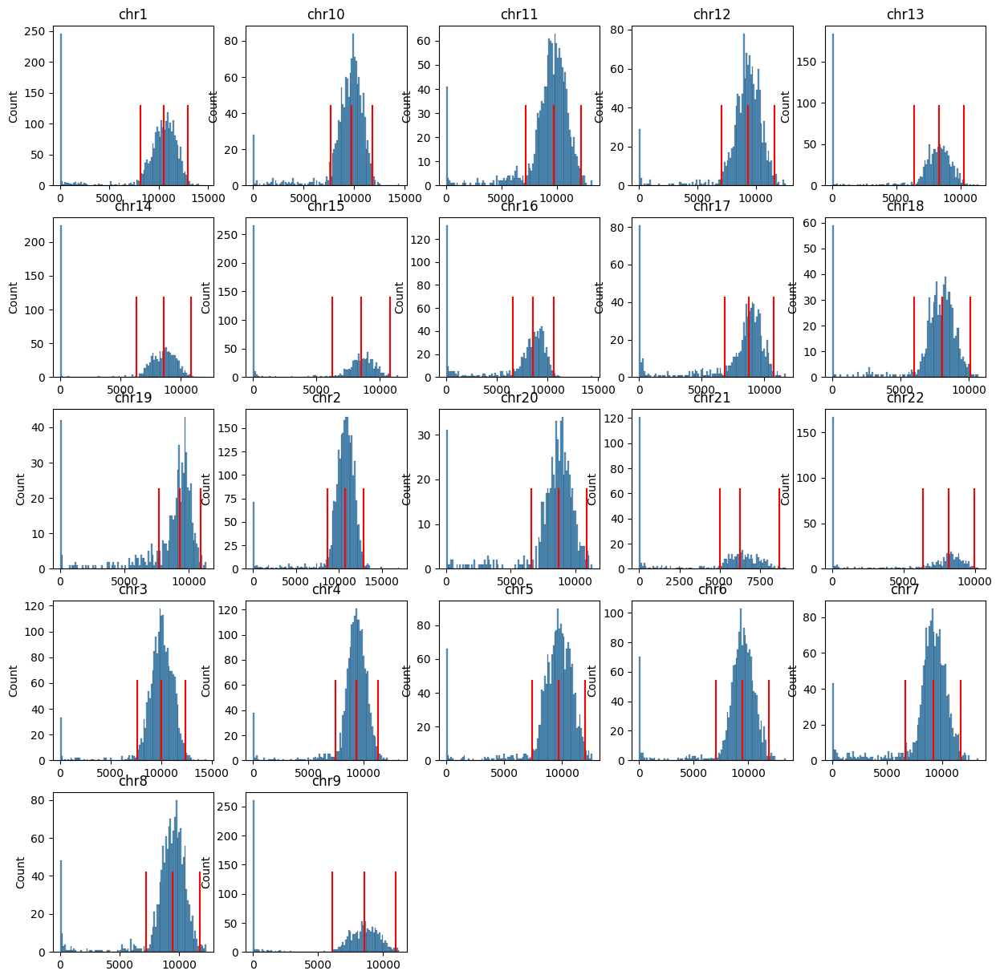

In [271]:
Qall = []
binall = []

cool = cooler.Cooler(f'./raw.5K.mcool::resolutions/100000')

fig, axes = plt.subplots(5, 5, figsize=(15, 15))
for i,c in enumerate(chrom_sizes.index):
    Q = cool.matrix(balance=False, sparse=True).fetch(c).toarray()
    Q = Q - np.diag(np.diag(Q))
    
    rowsum = Q.sum(axis=0)
    thres = [np.percentile(rowsum[rowsum>0], 50), np.percentile(rowsum[rowsum>0], 99)]
    thres.append(thres[0]*2-thres[1])
    if thres[-1] < 5000: 
        thres[-1] = 5000 
    ax = axes.flatten()[i]
    sns.histplot(rowsum, bins=100, ax=ax)
    for t in thres:
        ax.plot([t, t], [0, ax.get_ylim()[1]*0.5], c='r')
    ax.set_title(c)
    binfilter = (rowsum>thres[-1])
    binall.append(binfilter)
    Q = Q[binfilter][:, binfilter]
    Qall.append(Q)
    print(c)

for i in range(chrom_sizes.shape[0], axes.flatten().shape[0]):
    axes.flatten()[i].axis('off')
    
import pickle

with open('./mFC_binfilter.pkl', 'wb') as f:
    pickle.dump(binall, f)

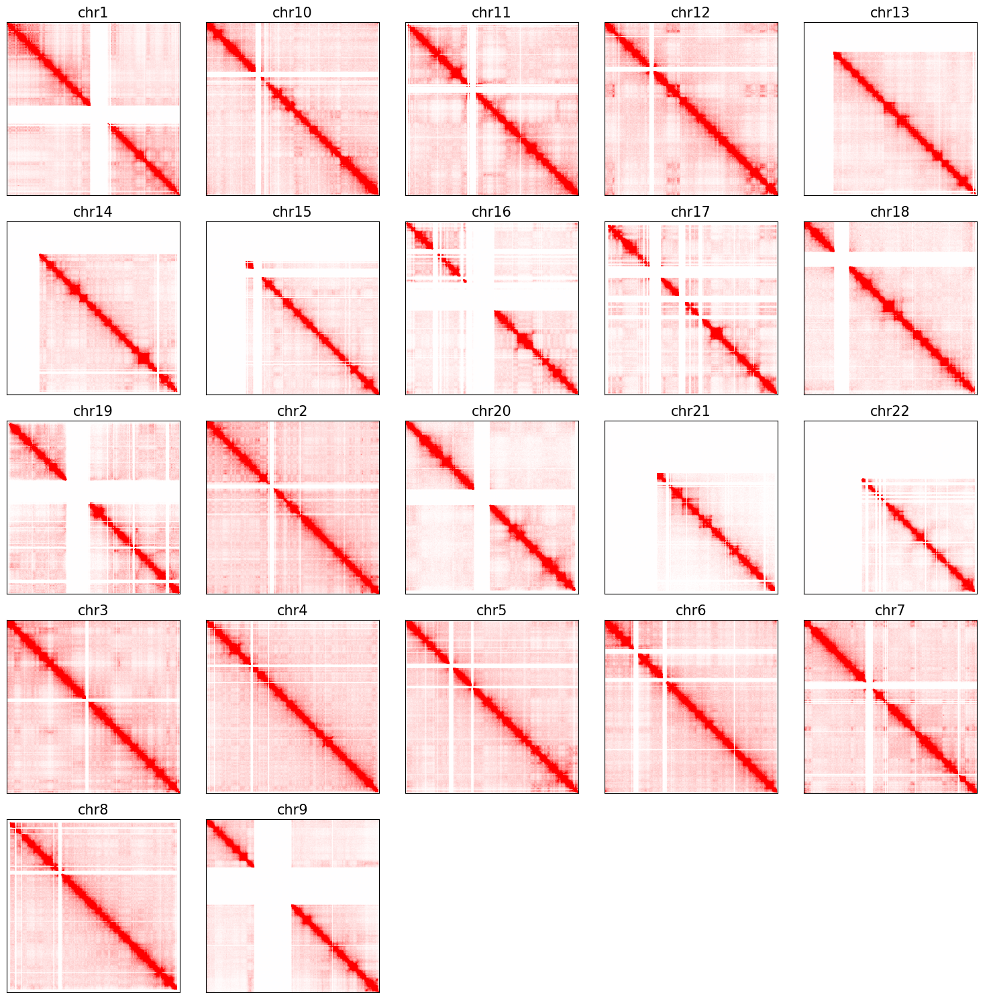

In [98]:
fig, axes = plt.subplots(5, 5, figsize=(15,15))
for i, c in enumerate(chrom_sizes.index):
    ax = axes.flatten()[i]
    n_bins = int(chrom_sizes[c] // 100000) + 1
    tmp = np.zeros((n_bins, n_bins))
    
    tmp[np.ix_(binall[i], binall[i])] = Qall[i]
    ax.imshow(tmp, cmap = 'bwr', vmin = -np.percentile(Qall[i], 95), vmax = np.percentile(Qall[i], 95))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(c, fontsize=15)

for i in range(chrom_sizes.shape[0], axes.flatten().shape[0]):
    axes.flatten()[i].axis('off')
    
plt.tight_layout()

# Get bulk model to calculate cell type compartment

In [99]:
Call, pcall, modelall = compbulk(Qall, chrom_sizes, binall, subset_cpg)


start distance normalization for chrom chr1...
start PCA...
start distance normalization for chrom chr10...
start PCA...
start distance normalization for chrom chr11...
start PCA...
start distance normalization for chrom chr12...
start PCA...
start distance normalization for chrom chr13...
start PCA...
start distance normalization for chrom chr14...
start PCA...
start distance normalization for chrom chr15...
start PCA...
start distance normalization for chrom chr16...
start PCA...
start distance normalization for chrom chr17...
start PCA...
start distance normalization for chrom chr18...
start PCA...
start distance normalization for chrom chr19...
start PCA...
start distance normalization for chrom chr2...
start PCA...
start distance normalization for chrom chr20...
start PCA...
start distance normalization for chrom chr21...
start PCA...
start distance normalization for chrom chr22...
start PCA...
start distance normalization for chrom chr3...
start PCA...
start distance normalizatio

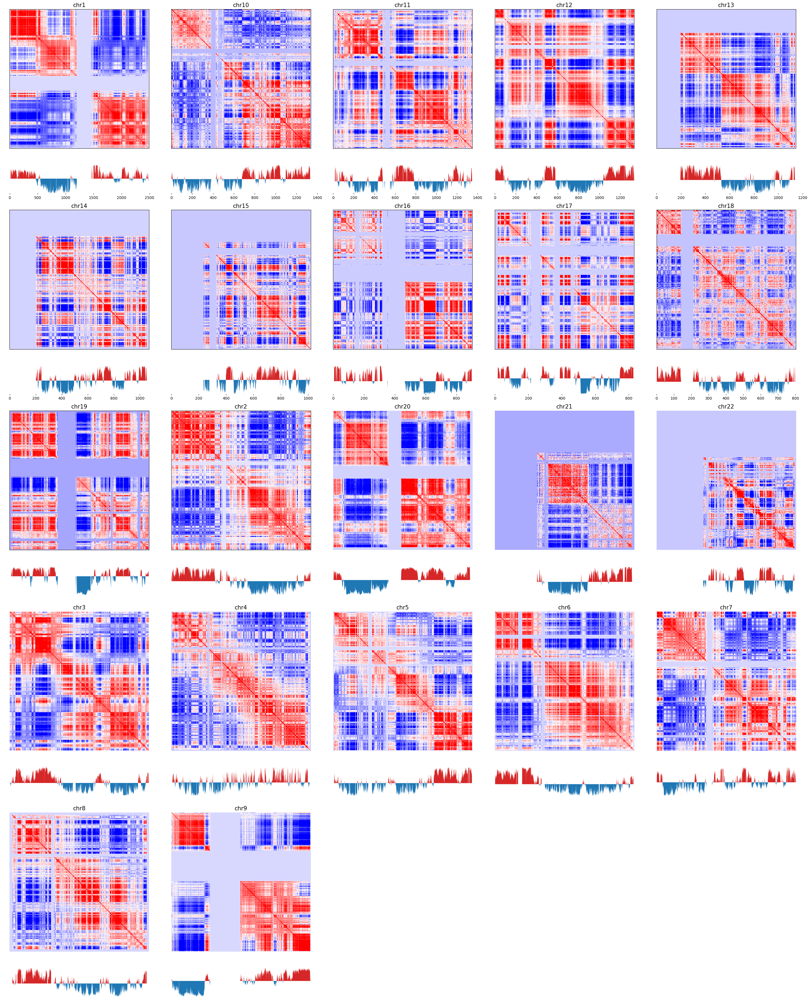

In [103]:
fig, axes = plt.subplots(10, 5, figsize=(30, 37), 
                         gridspec_kw={'height_ratios':[5,1,5,1,5,1,5,1,5,1]})

for i,c in enumerate(chrom_sizes.index[:]):
    nrow = 2*(i // 5)
    ncol = i % 5
    ax = axes[nrow, ncol]
    n_bins = int(chrom_sizes[c] // 100000) + 1
    tmp = np.zeros((n_bins, n_bins))
    tmp[np.ix_(binall[i], binall[i])] = Call[i]
    ax.imshow(tmp, cmap='bwr', vmin=np.percentile(Call[i], 5), vmax=np.percentile(Call[i], 95))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(c, fontsize=15)
    
    nrow = nrow + 1
    ax = axes[nrow, ncol]
    sns.despine(bottom=True, left=True, ax=ax)
    tmp = np.zeros(n_bins)
    tmp[binall[i]] = pcall[i]
    x, y = np.arange(n_bins), tmp
    ax.fill_between(x, y, 0, where=y >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(x, y, 0, where=y <= 0, facecolor='C0', interpolate=True)
    ax.set_yticks([])
    ax.set_ylim([np.percentile(y, 1), np.percentile(y, 99)])

for i in range(chrom_sizes.shape[0], axes.flatten().shape[0]):
    axes.flatten()[i].axis('off')

plt.tight_layout()

# Transform cell-type matrices using bulk model

In [104]:
pca = PCA(n_components=2)

In [105]:
mode = 'raw'
res = 100000

In [ ]:
sad = np.zeros((len(leg), 50, 50))
count = np.zeros((len(leg), 50, 50))
comp = []

cpu = 8
with ProcessPoolExecutor(cpu) as executor:
    futures = {}
    for t,ct in enumerate(leg):
        if mode=='impute':
            cool = cooler.Cooler(f'{ipath}{ct}/{ct}.Q.cool')
        elif mode=='raw':
            cool = cooler.Cooler('./raw.5K.mcool::resolutions/100000')

        future = executor.submit(
            compsaddle,
            cool=cool,
        )
        futures[future] = t

    for future in as_completed(futures):
        t = futures[future]
        ct = leg[t]
        xx, yy, zz = future.result()
        comp.append(pd.Series(xx, name=ct))
        sad[t] += yy
        count[t] += zz
        print(f'{ct} finished')
        
bins_df = cool.bins()[:]
bins_df.index = bins_df['chrom'].astype(str) + '-' + (bins_df['start'] // res).astype(str)
compidx = np.concatenate([bins_df.index[bins_df['chrom']==c][binall[i]] for i,c in enumerate(chrom_sizes.index[:])])


comp = pd.concat(comp, axis=1)
comp.index = compidx

sad = sad / count

In [ ]:
bins_df.index = bins_df['chrom'].astype(str) + '-' + bins_df['start'].astype(str) + '-' + bins_df['end'].astype(str)
compidx = np.concatenate([bins_df.index[bins_df['chrom']==c][binall[i]] for i,c in enumerate(chrom_sizes.index[:])])

comp.index = compidx

In [274]:
leg_select = ['Rods','Muller_glia','Cones','GABA_amacrine']


/tmp/ipykernel_3883357/2574927044.py:47: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern dropped
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:FFTM dropped
INFO:fontTools.subset:GPOS pruned
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 35 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'G', 'M', 'R', 'a', 'c', 'd', 'e', 'eight', 'five', 'four', 'g', 'i', 'l', 'm', 'minus', 'n', 'nonmarkingreturn', 'o', 'one', 'period', 'r', 's', 'seven', 'six', 'space', 'three', 'two', 'u', 'underscore', 'zero']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 17, 19, 20, 21, 22, 23, 24, 25, 26, 27, 36, 37, 

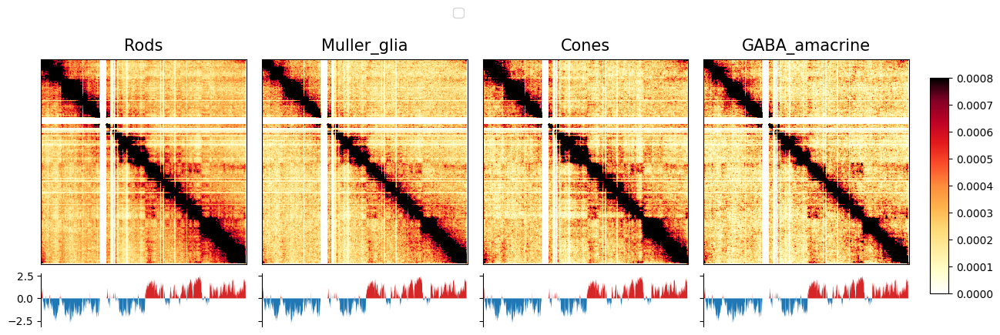

In [311]:
binall = np.load('./mFC_binfilter.pkl', allow_pickle=True)

chrom = 'chr10'
binfilter = binall[1]
res = 100_000
n_bins = (int(chrom_sizes.loc[chrom]) // res + 1)

fig, axes = plt.subplots(2, 4, figsize=(12, 4), gridspec_kw={'height_ratios':[2, 0.5]}, sharex='col', sharey='row')

for k, ct in enumerate(leg_select):
    cool = cooler.Cooler(f'{ipath}/{ct}/{ct}.Q.cool::/')
    Q = cool.matrix(balance=False, sparse=True).fetch(chrom).toarray()
    Q = Q - np.diag(np.diag(Q))
    
    ax = axes[0, k]
    tmp = np.zeros((n_bins, n_bins))
    tmp[np.ix_(binfilter, binfilter)] = Q[binfilter][:, binfilter]

    im = ax.imshow(tmp, cmap = 'fall', vmin = 0, vmax = 0.0008)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(ct, fontsize = 15, y = 1.01)
    
    ax = axes[1, k]
    sns.despine(bottom=True, ax=ax)
    tmp = np.zeros(n_bins)
    tmp[binfilter] = comp.loc[(comp.index.str.split('-').str[0] == chrom), ct]

    ax.fill_between(np.arange(len(tmp)), tmp, 0, where = tmp >= 0, facecolor='C3', interpolate=True)
    ax.fill_between(np.arange(len(tmp)), tmp, 0, where = tmp <= 0, facecolor='C0', interpolate=True)

cbar_ax = fig.add_axes([1.01, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax, orientation='vertical')

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))

fig.legend(by_label.values(), by_label.keys(), loc='upper center', ncol=2, bbox_to_anchor=(0.5, 1.1), fontsize=12)

plt.tight_layout()
